In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint ,  solve_ivp

import itertools
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"


In [2]:
def opto_non_linear(t,z,g_z0,g_z1,g_y,del_omega,N0):
    q,p,a_0,a_p1,a_m1,a_0_d,a_p1_d,a_m1_d=z
    n_0=a_0_d*a_0
    sigma_m=1j*(a_0_d*(a_p1-a_m1)-a_0*(a_p1_d-a_m1_d))
    q_dot     =-p
    p_dot     =q+g_y*sigma_m*N0
    
    a_0_dot   = 1j*a_0*(-del_omega + ((g_z0-g_z1)**2*(2*n_0*N0+1)+2*g_z1*(g_z0-g_z1)*(N0+n_0*N0+1)) )  + g_y*q*(a_p1-a_m1)/2
    a_p1_dot  = 1j*a_p1*(2*g_z1*(g_z0-g_z1)*n_0*N0 )    - g_y*q*a_0/2
    a_m1_dot  = 1j*a_m1*(2*g_z1*(g_z0-g_z1)*n_0*N0 )    + g_y*q*a_0/2
    
    a_0_d_dot =  1j*a_0_d*(del_omega - ((g_z0-g_z1)**2*(2*n_0*N0+1)+2*g_z1*(g_z0-g_z1)*(N0+n_0*N0+1)) )+ g_y*q*(a_p1_d-a_m1_d)/2
    a_p1_d_dot= -1j*a_p1_d*(2*g_z1*(g_z0-g_z1)*n_0*N0 ) - g_y*q*a_0_d/2
    a_m1_d_dot= -1j*a_m1_d*(2*g_z1*(g_z0-g_z1)*n_0*N0 ) + g_y*q*a_0_d/2
    
    x_list=[q_dot,p_dot,a_0_dot,a_p1_dot,a_m1_dot,a_0_d_dot,a_p1_d_dot,a_m1_d_dot]
    return x_list

def opto_linear(t,z,g_z0,g_z1,g_y, del_omega,N0):
    q,p,a_0,a_p1,a_m1,a_0_d,a_p1_d,a_m1_d=z
    delta=del_omega-2*g_z1*(g_z0-g_z1)*N0-(g_z0**2-g_z1**2)
    sigma_m=1j*(a_p1-a_m1-a_p1_d-a_m1_d)
    q_dot     =-p
    p_dot     =q+g_y*sigma_m*N0
    
    a_0_dot   = 0
    a_p1_dot  = 1j*a_p1*delta    - g_y*q/2
    a_m1_dot  = 1j*a_m1*delta   + g_y*q/2
    
    a_0_d_dot =  0
    a_p1_d_dot= -1j*a_p1_d*delta- g_y*q/2
    a_m1_d_dot= -1j*a_m1_d*delta + g_y*q/2
    

    x_list=[q_dot,p_dot,a_0_dot,a_p1_dot,a_m1_dot,a_0_d_dot,a_p1_d_dot,a_m1_d_dot]
    return x_list

# def lyapunov(g_z0,g_z1,g_y, omega_0, omega_1,del_omega,N0):
#     H=np.zeros((8,8),dtype=complex)
#     eta=2*g_z1*(g_z0-g_z1)*N0
#     delta=-del_omega + ((g_z0-g_z1)**2+2*g_z1*(g_z0-g_z1))*(2*N0+1)
#     H[0,1]=-1
#     H[1,0]=1
#     H[1,3]=1j*g_y*N0
#     H[1,4]=-1j*g_y*N0
#     H[1,6]=-1j*g_y*N0
#     H[1,7]=1j*g_y*N0
#     H[3,0]=-g_y/2
#     H[4,0]=g_y/2
#     H[6,0]=-g_y/2
#     H[7,0]=g_y/2
#     H[2,2]=1j*delta
#     H[5,5]=-1j*delta
#     H[3,3]=1j*eta
#     H[4,4]=1j*eta
    
#     H[6,6]=-1j*eta
#     H[7,7]=-1j*eta
#     E=np.linalg.eigvals(H)
#     return E

    
def evolve(q_0,p_0,a,tf,param_list,N_step=300,linear=False):
    g_z0,g_z1,g_y, del_omega, N0=param_list
    z0=np.array([q_0,p_0,a[0],a[1],a[-1],a[0].conj(),a[1].conj(),a[-1].conj()])
    
    t = np.linspace(0,tf,N_step)
    func= opto_linear if linear else opto_non_linear
    xx=solve_ivp(func, [0,tf],z0,args=param_list,dense_output=True,rtol = 1e-8, atol = 1e-8, t_eval=t)
    zz=xx.sol(t)
    sol=[]
    q=np.real(zz[0])
    p=np.real(zz[1])
    sol.append(q)
    sol.append(p)
    E_mech=(p**2+q**2)/4
    
    n_0=zz[2]*zz[5]
    n_p1=zz[3]*zz[6]
    n_m1=zz[4]*zz[7]
    #E_opt=omega_1*(n_p1+n_m1)+omega_0*n_0
    N=n_0+n_p1+n_m1
    sigma_m=1j*(zz[5]*(zz[3]-zz[4])-zz[2]*(zz[6]-zz[7]))
    
    sol.append(np.real(1-n_0))
    sol.append(np.real(n_p1))
    sol.append(np.real(n_m1))
    sol.append(np.real(sigma_m))
    sol.append(E_mech)
    #sol.append(E_opt)
    return sol,t
    

In [3]:
g_y=1.24e6   ##Hz
omega_0=4.45e15 ##Hz
del_omega=1e8
omega_1=omega_0-del_omega ##Hz
ohm=1e6         ##Hz
g_z0=0
g_z1=(20*ohm)**0.5
delta_0=100*ohm
N0=1e1

g_y/=ohm
g_z1/=ohm
g_z0/=ohm
omega_1/=ohm
omega_0/=ohm
del_omega/=ohm

# delta=omega_0-omega_1-2*g_z1*(g_z0-g_z1)*N_0/ohm
# rr=g_y*(N0*ohm/delta**3)**0.5

# print(1/rr)


# param_list=[g_z0,g_z1,g_y,omega_0,omega_1,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
# tf=5e-4                ### DO NOT increase this by a lot

# q_0,p_0=1.612*1e-4+0j,0.+0j
# #q,p=0 , 0
label_list=["$Q$","$P$","$1-n_0$","$n_1$","$n_{-1}$","$\sigma_-$","E_mech"]
# N0_list=np.linspace(1,1e1,4)

$\lambda_{\pm}^2=\frac{(1+\Delta^2)\pm \sqrt{(1-\Delta^2)^2-8\Delta g_y^2 N_0}}{2}$
$\newline$
$\Delta=\delta_\omega-2N_0 g_1^z(g_0^z-g_1^z)+(g_0^z)^2-(g_1^z)^2$


In [5]:
def lyapunov(param_list):
    g_z0,g_z1,g_y,del_omega,N0=param_list
    E=[]
    delta=del_omega-2*N0*g_z1*(g_z0-g_z1)+g_z0**2-g_z1**2
    lam_p1=(((1+delta**2)+((1-delta**2)**2-8*delta*g_y**2*N0)**0.5)/2)**0.5
    lam_p2=-lam_p1
    lam_m1=(((1+delta**2)-((1-delta**2)**2-8*delta*g_y**2*N0)**0.5)/2)**0.5
    lam_m2=-lam_m1
    E.append(lam_p1)
    E.append(lam_p2)
    E.append(lam_m1)
    E.append(lam_m2)
    return E

def Pc(param_list):
    g_z0,g_z1,g_y,del_omega,N0=param_list
    delta=del_omega-2*N0*g_z1*(g_z0-g_z1)+g_z0**2-g_z1**2
    #Pc=g_y**2*N_0/delta
    Pc=(8*delta*g_y**2*N0)/(1-delta**2)**2
    return Pc

def freq(param_list):
    g_z0,g_z1,g_y,del_omega,N0=param_list
    delta=del_omega+2*N0*g_z1*(g_z0-g_z1)+(g_z0**2-g_z1**2)
    w_m=1-g_y**2*N0/delta
    w_p=delta+g_y**2*N0/delta**2
    return w_m,w_p

In [27]:
Pc([g_z0,g_z1,g_y,del_omega,1])

7.201366752043302e-05

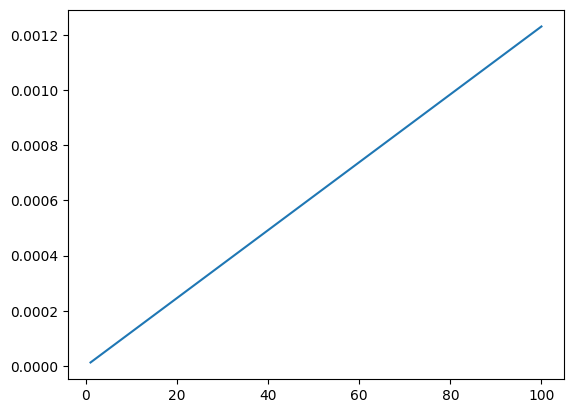

In [59]:
g_y=1.24e0   ##Hz

N0_list=np.linspace(1,1e2,100)
Pc_list=[Pc([g_z0,g_z1,g_y,del_omega,N0]) for N0 in N0_list]
plt.plot(N0_list,Pc_list)
plt.show()

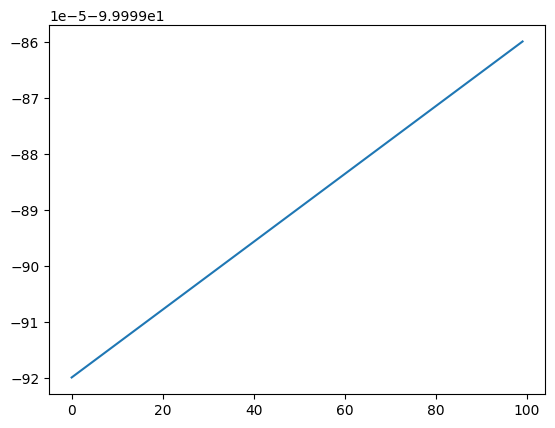

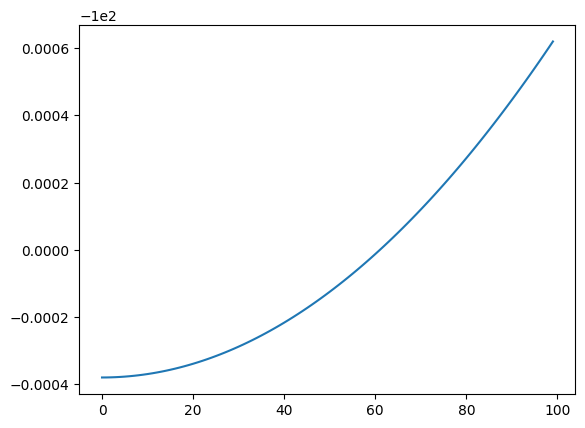

In [39]:
g_y=1e0
N0_num=100
N0_list=np.linspace(1,2,N0_num)
lam_min=np.zeros(N0_num)
lam_max=np.zeros(N0_num)

for i,N0 in enumerate(N0_list):
    E=lyapunov([g_z0,g_z1,g_y,del_omega,N0])
    lam_min[i]=np.min(np.real(E))
    #lam_max[i]=np.max(np.real(E))
    
plt.plot(lam_min)
#plt.plot(lam_max)


plt.show()

N0=10
g_y_num=100
g_y_list=np.linspace(1e-4,1e0,N0_num)
lam_min=np.zeros(N0_num)
lam_max=np.zeros(N0_num)

for i,g_y in enumerate(g_y_list):
    E=lyapunov([g_z0,g_z1,g_y,del_omega,N0])
    lam_min[i]=np.min(np.real(E))
    #lam_max[i]=np.max(np.real(E))
    
plt.plot(lam_min)
#plt.plot(lam_max)
plt.show()

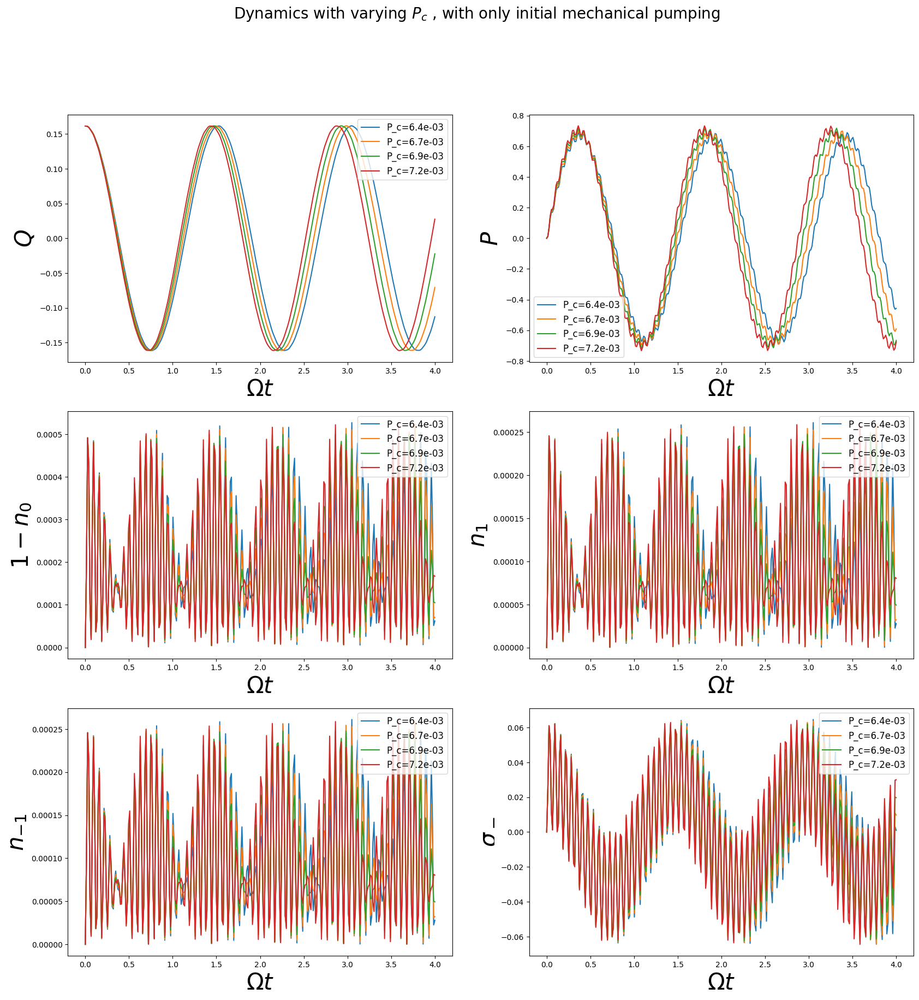

In [15]:
tf=4e0
N_step=300
g_y=1e1
fig, axs = plt.subplots(3, 2,figsize=(20,20))
fig.suptitle('Dynamics with varying '+"$P_c$"+" , with only initial mechanical pumping", fontsize=20)
N0_list=np.linspace(8,9,4)
q_0,p_0=1.612*1e-1+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])

for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
    for i in range(6):
        axs[i//2,i%2].plot(t,zz[i],label="P_c"+'='+"{:.1e}".format(Pc(param_list)))
for i in range(6):
    axs[i//2,i%2].set_ylabel(label_list[i],fontsize=30)
    axs[i//2,i%2].set_xlabel('$\Omega  t$',fontsize=30)
    axs[i//2,i%2].legend(fontsize=12)

plt.show() 

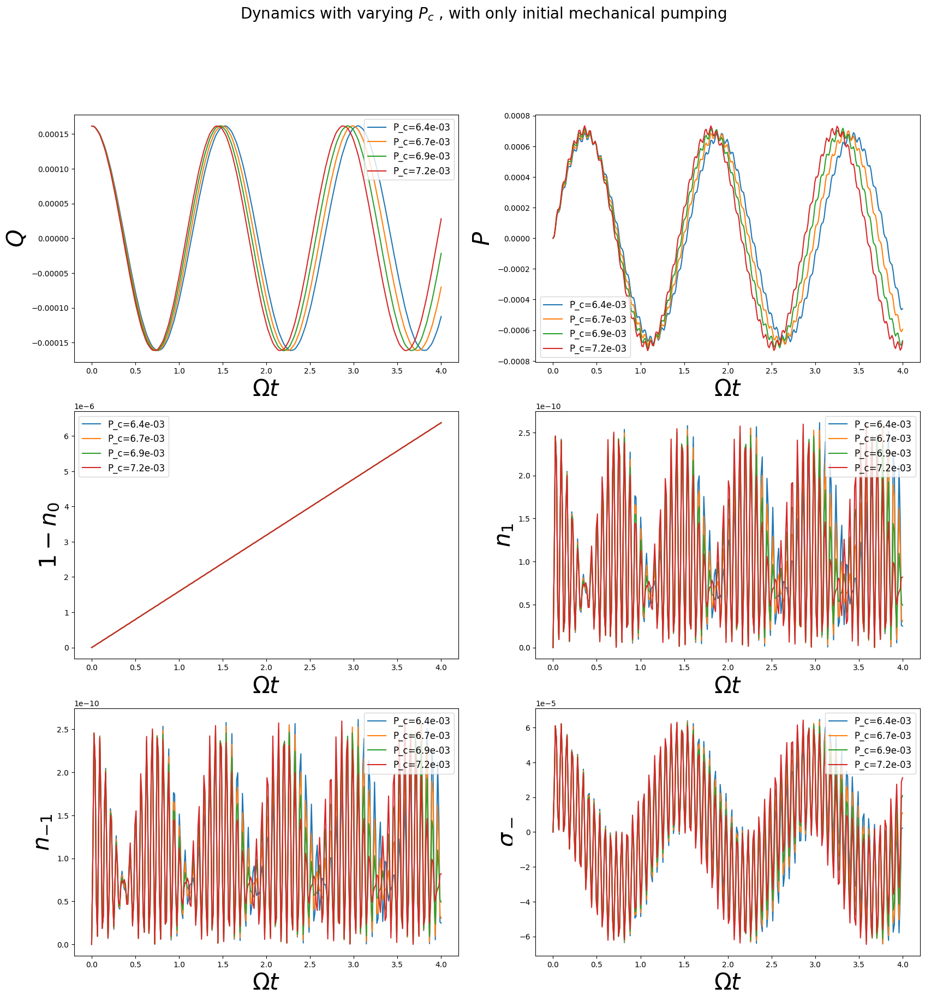

In [70]:
tf=4e0
N_step=300
g_y=1e1
fig, axs = plt.subplots(3, 2,figsize=(20,20))
fig.suptitle('Dynamics with varying '+"$P_c$"+" , with only initial mechanical pumping", fontsize=20)
N0_list=np.linspace(8,9,4)
q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])

for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
    for i in range(6):
        axs[i//2,i%2].plot(t,zz[i],label="P_c"+'='+"{:.1e}".format(Pc(param_list)))
for i in range(6):
    axs[i//2,i%2].set_ylabel(label_list[i],fontsize=30)
    axs[i//2,i%2].set_xlabel('$\Omega  t$',fontsize=30)
    axs[i//2,i%2].legend(fontsize=12)

plt.show() 

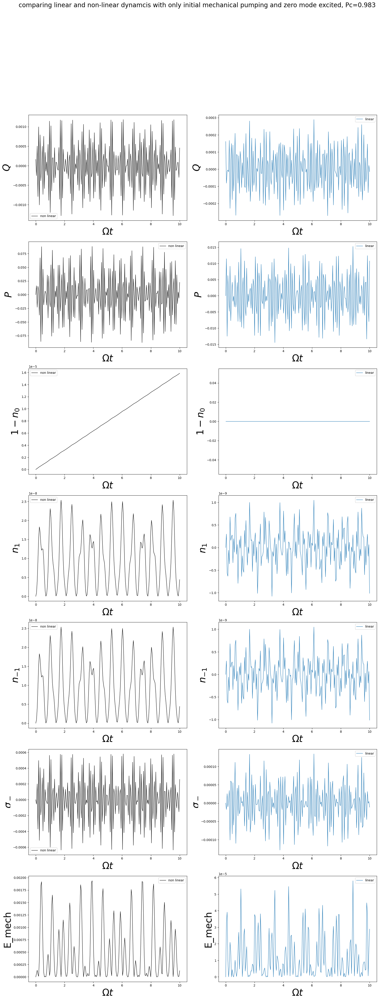

In [89]:
tf=1e1
g_y=1.24e7/ohm   ##Hz

q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])
N_step=2*10**2
om=np.arange(N_step)
N0=800
param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq

fig, axs = plt.subplots(7, 2,figsize=(20,50))
title="comparing linear and non-linear dynamcis with only initial mechanical pumping and zero mode excited, Pc={0}".format(np.round(Pc(param_list),3))
fig.suptitle(title, fontsize=20)
zz_nl,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
zz_l,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=True)
for i in range(7):
    axs[i,0].plot(t,zz_nl[i],label="non linear",color='k',linewidth=1)
    axs[i,1].plot(t,zz_l[i],label="linear",linewidth=1)

        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

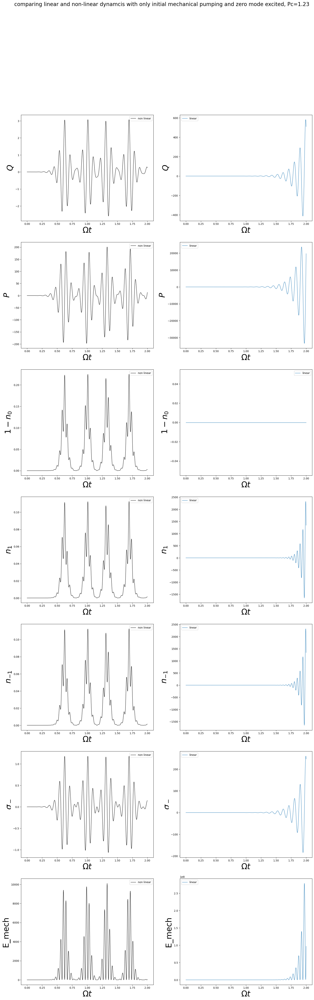

In [7]:
tf=2e0
g_y=1.24e7/ohm   ##Hz

q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])
N_step=10**3
om=np.arange(N_step)
N0=1000
param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq

fig, axs = plt.subplots(7, 2,figsize=(20,60))
title="comparing linear and non-linear dynamcis with only initial mechanical pumping and zero mode excited, Pc={0}".format(np.round(Pc(param_list),2))
fig.suptitle(title, fontsize=20)
zz_nl,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
zz_l,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=True)
for i in range(7):
    axs[i,0].plot(t,zz_nl[i],label="non linear",color='k',linewidth=1)
    axs[i,1].plot(t,zz_l[i],label="linear",linewidth=1)

        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

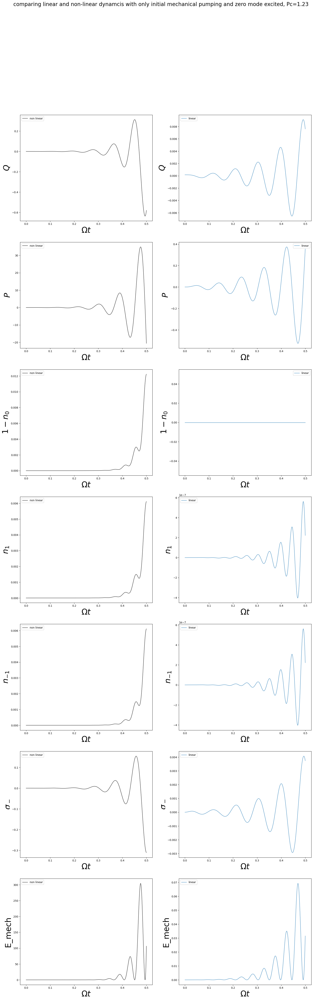

In [85]:
tf=9e-1
g_y=1.24e7/ohm   ##Hz

q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])
N_step=10**3
om=np.arange(N_step)
N0=1000
param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq

fig, axs = plt.subplots(7, 2,figsize=(20,60))
title="comparing linear and non-linear dynamcis with only initial mechanical pumping and zero mode excited, Pc={0}".format(np.round(Pc(param_list),2))
fig.suptitle(title, fontsize=20)
zz_nl,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
zz_l,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=True)
for i in range(7):
    axs[i,0].plot(t,zz_nl[i],label="non linear",color='k',linewidth=1)
    axs[i,1].plot(t,zz_l[i],label="linear",linewidth=1)

        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

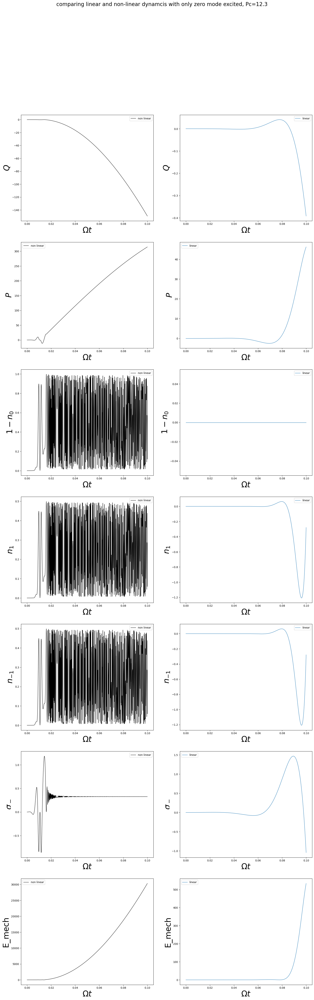

In [14]:
tf=1e0
g_y=1.24e9/ohm   ##Hz

q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])
N_step=10**3
om=np.arange(N_step)
N0=1
param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq

fig, axs = plt.subplots(7, 2,figsize=(20,60))
title="comparing linear and non-linear dynamcis with only zero mode excited, Pc={0}".format(np.round(Pc(param_list),2))
fig.suptitle(title, fontsize=20)
zz_nl,t=evolve(q_0,p_0,psi_0,tf=1,param_list=param_list,N_step=N_step,linear=False)
zz_l,t=evolve(q_0,p_0,psi_0,tf=0.1,param_list=param_list,N_step=N_step,linear=True)
for i in range(7):
    axs[i,0].plot(t,zz_nl[i],label="non linear",color='k',linewidth=1)
    axs[i,1].plot(t,zz_l[i],label="linear",linewidth=1)

        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

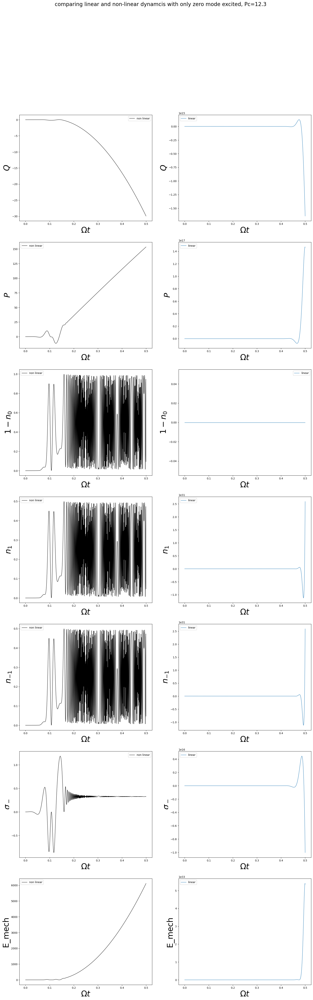

In [95]:
tf=5e-1
g_y=1.24e9/ohm   ##Hz

q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])
N_step=10**3
om=np.arange(N_step)
N0=1
param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq

fig, axs = plt.subplots(7, 2,figsize=(20,60))
title="comparing linear and non-linear dynamcis with only zero mode excited, Pc={0}".format(np.round(Pc(param_list),2))
fig.suptitle(title, fontsize=20)
zz_nl,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
zz_l,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=True)
for i in range(7):
    axs[i,0].plot(t,zz_nl[i],label="non linear",color='k',linewidth=1)
    axs[i,1].plot(t,zz_l[i],label="linear",linewidth=1)

        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

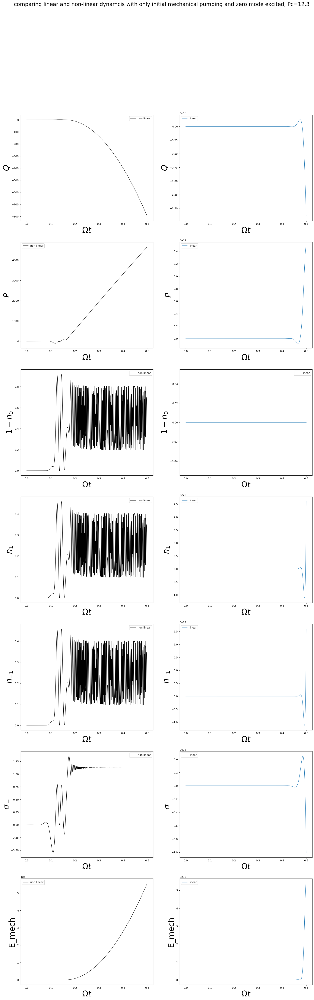

In [90]:
tf=5e-1
g_y=1.24e8/ohm   ##Hz

q_0,p_0=1.612*1e-4+0j,0.+0j
psi_0=np.array([1+0j,0+0j,0+0j])
N_step=10**3
om=np.arange(N_step)
N0=100
param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq

fig, axs = plt.subplots(7, 2,figsize=(20,60))
title="comparing linear and non-linear dynamcis with only initial mechanical pumping and zero mode excited, Pc={0}".format(np.round(Pc(param_list),2))
fig.suptitle(title, fontsize=20)
zz_nl,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=False)
zz_l,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step,linear=True)
for i in range(7):
    axs[i,0].plot(t,zz_nl[i],label="non linear",color='k',linewidth=1)
    axs[i,1].plot(t,zz_l[i],label="linear",linewidth=1)

        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

99.99906976652223 1.1162642698850749
99.9989559831234 1.1299568137536615
99.99884219878804 1.1434854814487332


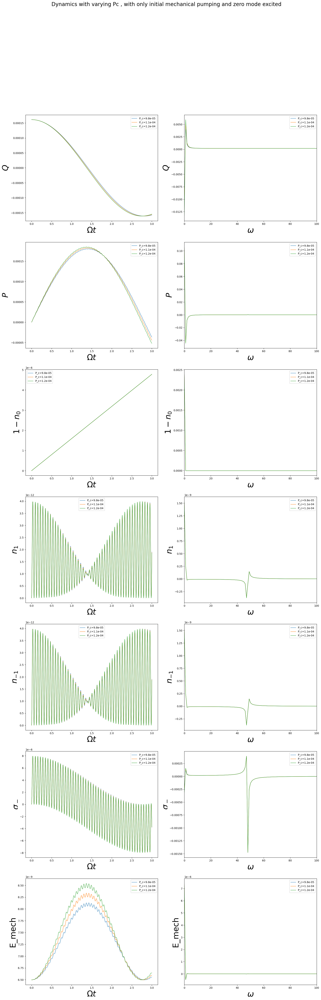

In [63]:
tf=3e0
q_0,p_0=1.612*1e-4+0j,0.+0j
g_y=1.24e6/ohm   ##Hz
psi_0=np.array([1+0j,0+0j,0+0j])
om=np.arange(N_step)
N_step=10**3
fig, axs = plt.subplots(7, 2,figsize=(20,60))
fig.suptitle('Dynamics with varying '+'Pc'+" , with only initial mechanical pumping and zero mode excited", fontsize=20)
N0_list=np.linspace(8,10,3)
for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    w_p1,w_p2,w_m1,w_m2=lyapunov(param_list)
    print(w_p1,w_m1)
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step)
    for i in range(7):
        axs[i,0].plot(t,zz[i],label="P_c"+'='+"{:.1e}".format(Pc(param_list)),linewidth=1)
        axs[i,1].plot(om,np.fft.fft(zz[i]),label="P_c"+'='+"{:.1e}".format(Pc(param_list)),linewidth=1)
        axs[i,1].set_xlim(0,100)
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\omega$',fontsize=30)
    axs[i,1].legend(fontsize=10)

plt.show() 

99.99906976652223 1.1162642698850749
99.99903183882667 1.1208470288911907
99.99899391102707 1.1254111348375309
99.9989559831234 1.1299568137536615


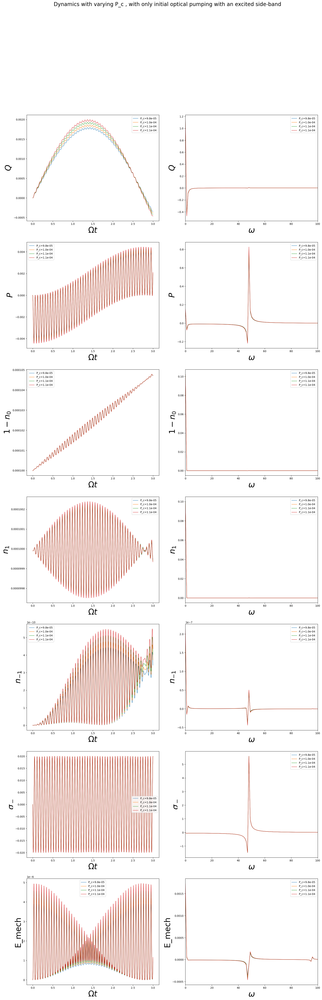

In [64]:
tf=3e0
q_0,p_0=0,0
g_y=1.24e6/ohm   ##Hz
psi_0=np.array([1+0j,1e-2+0j,0+0j])
psi_0/=np.linalg.norm(psi_0)
N_step=10**3
om=np.arange(N_step)

fig, axs = plt.subplots(7, 2,figsize=(20,60))
fig.suptitle('Dynamics with varying '+"P_c"+" , with only initial optical pumping with an excited side-band", fontsize=20)
N0_list=np.linspace(8,9,4)
for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    w_p1,w_p2,w_m1,w_m2=lyapunov(param_list)
    print(w_p1,w_m1)
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step)
    for i in range(7):
        axs[i,0].plot(t,zz[i],label="P_c"+'='+"{:.1e}".format(Pc(param_list)),linewidth=1)
        axs[i,1].plot(om,np.fft.fft(zz[i]),label="P_c"+'='+"{:.1e}".format(Pc(param_list)),linewidth=1)
        axs[i,1].set_xlim(0,100)
        
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\omega$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

99.99906976652223 1.1162642698850749
99.99903183882667 1.1208470288911907
99.99899391102707 1.1254111348375309
99.9989559831234 1.1299568137536615


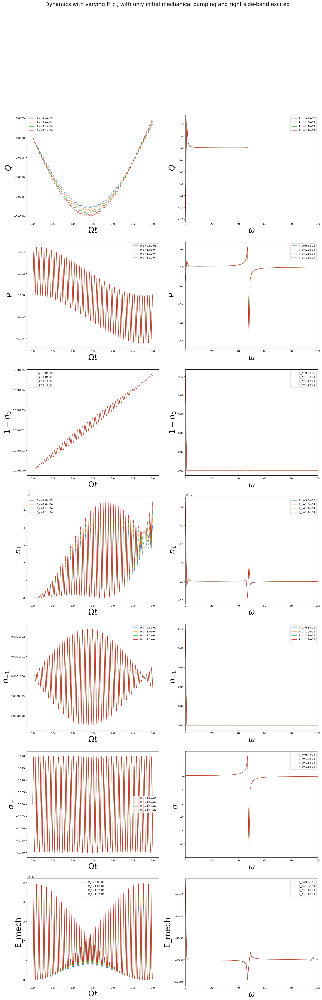

In [65]:
tf=3e0
q_0,p_0=0,0
g_y=1.24e6/ohm   ##Hz
psi_0=np.array([1+0j,0+0j,1e-2+0j])
psi_0/=np.linalg.norm(psi_0)
N_step=10**3
fig, axs = plt.subplots(7, 2,figsize=(20,60))
fig.suptitle('Dynamics with varying '+"P_c"+" , with only initial mechanical pumping and right side-band excited", fontsize=20)
N0_list=np.linspace(8,9,4)
for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    w_p1,w_p2,w_m1,w_m2=lyapunov(param_list)
    print(w_p1,w_m1)
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step)
    om=np.arange(N_step)
    for i in range(7):
        axs[i,0].plot(t,zz[i],label="P_c"+'='+"{:.1e}".format(Pc(param_list)),linewidth=1)
        axs[i,1].plot(om,np.fft.fft(zz[i]),label="P_c"+'='+"{:.1e}".format(Pc(param_list)),linewidth=1)
        axs[i,1].set_xlim(0,100)
for i in range(7):
    axs[i,0].set_ylabel(label_list[i],fontsize=30)
    axs[i,0].set_xlabel('$\Omega t$',fontsize=30)
    axs[i,0].legend(fontsize=10)
    axs[i,1].set_ylabel(label_list[i],fontsize=30)
    axs[i,1].set_xlabel('$\omega$',fontsize=30)
    axs[i,1].legend(fontsize=10)
    
plt.show() 

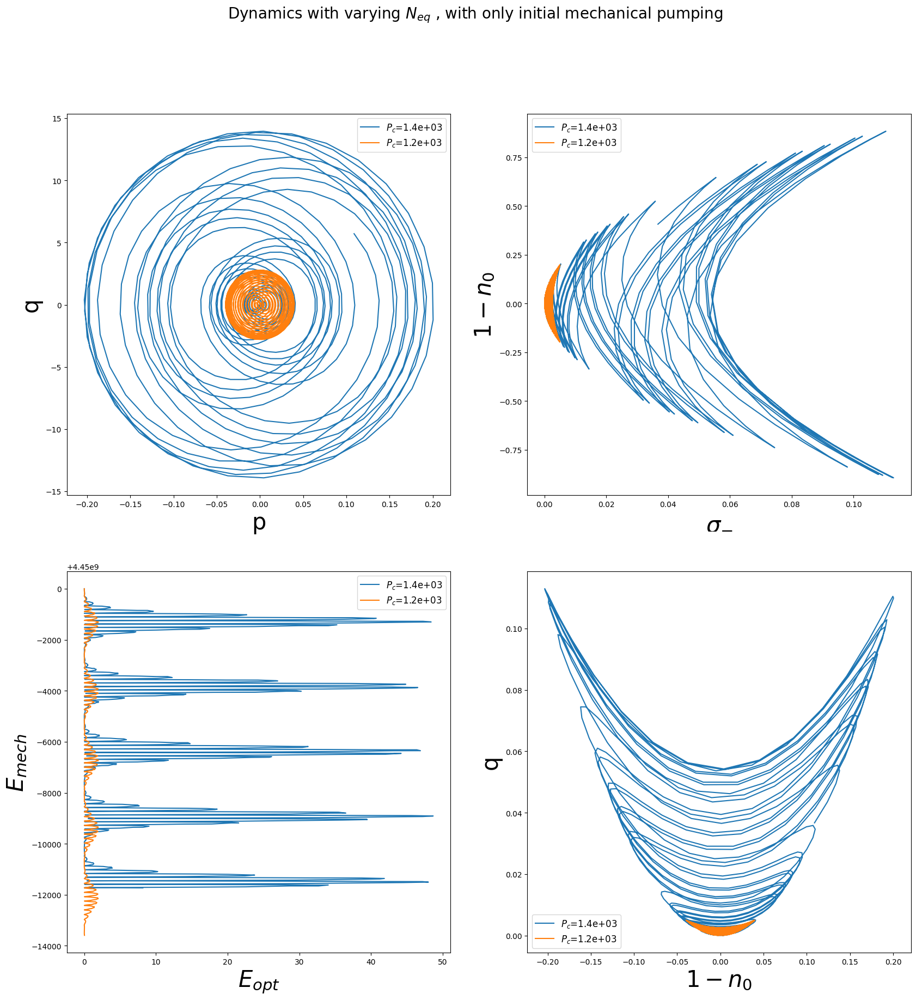

In [59]:
tf=3e0
N_step=1000
char="$P_c$"
q_0,p_0=0,0
psi_0=np.array([1+0j,0+0j,1e-2+0j])
psi_0/=np.linalg.norm(psi_0)

fig, axs = plt.subplots(2, 2,figsize=(20,20))
fig.suptitle("Dynamics with varying $N_{eq}$ , with only initial mechanical pumping", fontsize=20)
N0_list=np.linspace(9,8,2)
for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step)
    axs[0,0].plot(zz[0],zz[1],label=char+'='+"{:.1e}".format(Pc(param_list)))
    axs[0,1].plot(zz[2],zz[5],label=char+'='+"{:.1e}".format(Pc(param_list)))
    axs[1,0].plot(zz[6],zz[7],label=char+'='+"{:.1e}".format(Pc(param_list)))
    axs[1,1].plot(zz[0],zz[2],label=char+'='+"{:.1e}".format(Pc(param_list)))

axs[0,0].set_ylabel("q",fontsize=30)
axs[0,0].set_xlabel('p',fontsize=30)
axs[0,0].legend(fontsize=12)

axs[0,1].set_ylabel("$1-n_0$",fontsize=30)
axs[0,1].set_xlabel('$\sigma_{-}$',fontsize=30)
axs[0,1].legend(fontsize=12)

axs[1,0].set_ylabel("$E_{mech}$",fontsize=30)
axs[1,0].set_xlabel('$E_{opt}$',fontsize=30)
axs[1,0].legend(fontsize=12)

axs[1,1].set_ylabel("q",fontsize=30)
axs[1,1].set_xlabel('$1-n_0$',fontsize=30)
axs[1,1].legend(fontsize=12)


plt.show() 

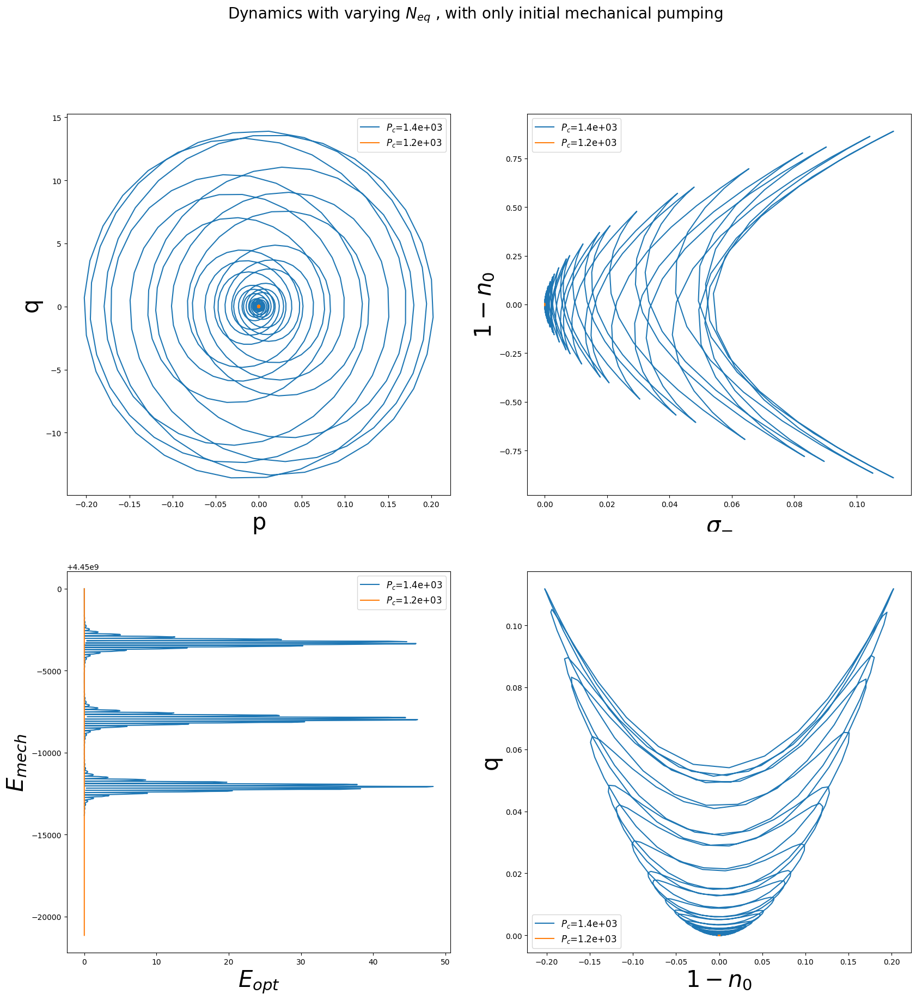

In [60]:
tf=3e0
N_step=1000
char="$P_c$"
psi_0=np.array([1+0j,0+0j,0+0j])
q_0,p_0=1.612*1e-4+0j,0.+0j

fig, axs = plt.subplots(2, 2,figsize=(20,20))
fig.suptitle("Dynamics with varying $N_{eq}$ , with only initial mechanical pumping", fontsize=20)
N0_list=np.linspace(9,8,2)
for N0 in (N0_list):
    param_list=[g_z0,g_z1,g_y,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
    zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step)
    axs[0,0].plot(zz[0],zz[1],label=char+'='+"{:.1e}".format(Pc(param_list)))
    axs[0,1].plot(zz[2],zz[5],label=char+'='+"{:.1e}".format(Pc(param_list)))
    axs[1,0].plot(zz[6],zz[7],label=char+'='+"{:.1e}".format(Pc(param_list)))
    axs[1,1].plot(zz[0],zz[2],label=char+'='+"{:.1e}".format(Pc(param_list)))

axs[0,0].set_ylabel("q",fontsize=30)
axs[0,0].set_xlabel('p',fontsize=30)
axs[0,0].legend(fontsize=12)

axs[0,1].set_ylabel("$1-n_0$",fontsize=30)
axs[0,1].set_xlabel('$\sigma_{-}$',fontsize=30)
axs[0,1].legend(fontsize=12)

axs[1,0].set_ylabel("$E_{mech}$",fontsize=30)
axs[1,0].set_xlabel('$E_{opt}$',fontsize=30)
axs[1,0].legend(fontsize=12)

axs[1,1].set_ylabel("q",fontsize=30)
axs[1,1].set_xlabel('$1-n_0$',fontsize=30)
axs[1,1].legend(fontsize=12)

plt.show() 

In [16]:

array_y=np.arange(10,110)
array_x=np.linspace(20,30,100)

def data_gen():
    for cnt in itertools.count():
        t = cnt 
        yield array_x[t], array_y[t]


def init():
    ax.set_ylim(-50, 50)
    ax.set_xlim(-0.5, 0.5)
    del xdata[:]
    del ydata[:]
    line.set_data(xdata, ydata)
    return line,

fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)
ax.grid()
xdata, ydata = [], []
plt.close()


def run(data):
    # update the data
    t, y = data
    xdata.append(t)
    ydata.append(y)
    xmin, xmax = ax.get_xlim()

    if t >= xmax:
        ax.set_xlim(xmin, 2*xmax)
        ax.figure.canvas.draw()
    line.set_data(xdata, ydata)

    return line,



In [17]:
tf=1e0
N_step=100
char="$N_{eq}$"
q_0,p_0=0,0
psi_0=np.array([1+0j,0+0j,1e-2+0j])
psi_0/=np.linalg.norm(psi_0)

# fig, axs = plt.subplots(2, 2,figsize=(20,20))
# fig.suptitle("Dynamics with varying $N_{eq}$ , with only initial mechanical pumping", fontsize=20)
N0=9
param_list=[g_z0,g_z1,g_y,ohm,omega_0,omega_1,del_omega,N0]   ##g_z0,g_z1,g_y,ohm, omega_0, omega_1, del_omega, N_eq
zz,t=evolve(q_0,p_0,psi_0,tf,param_list,N_step)
array_x=zz[0]
array_y=zz[1]
# Only save last 100 frames, but run forever
ani = animation.FuncAnimation(fig, run, data_gen, interval=100, init_func=init,
                              save_count=100)
ani